# Predict Click-Through-Rate (Local Machine)


## Problem to be solved:
The project is to predict whether a mobile ad will be clicked or not. Click-Through-Rate (CTR) metric is used for evaluating ad performance and CTR systems are widely used by internet economy. The problem and solutions are applicable to current internet economy. The problem provides quite a good learning opportunity with a typical setup in real word with lots of data and lots of features.

## Project Client:
The project is a completed [Kaggle Competetion](https://www.kaggle.com/c/avazu-ctr-prediction). There is already a solution available for the project and reward has been awarded to the winning team.

The project client is myself to see if I am able to apply advanced Machine Learning technologies and Data Science methodologies learned in this workshop to arrive to a solution that would match up to the top teams in the competition. Since the solution is available, there is a certainty to solution that one should arrive. 
As mentioned before, the main aim here is to apply learning of this course to a real life problem to 1) refine the learnings further 2) demonstrate the learnings  and 3) be ready to apply the learnings to next projects.

## Data Set:
The data-set is available [here](https://www.kaggle.com/c/avazu-ctr-prediction/data). The data-set contains training and test data. The data-set is in csv format. The zipped training data, is about 1 Gb in size and test data-set is about 118 Mb. The data-set is well defined with some of the categorical features anonymized.

## Data Fields:
* id: ad identifier
* click: 0/1 for non-click/click
* hour: format is YYMMDDHH, so 14091123 means 23:00 on Sept. 11, 2014 UTC.
* C1 -- anonymized categorical variable
* banner_pos
* site_id
* site_domain
* site_category
* app_id
* app_domain
* app_category
* device_id
* device_ip
* device_model
* device_type
* device_conn_type
* C14-C21 -- anonymized categorical variables

## Anonymized Categorical Variables:
Most of the fields are self-explanatory around mobile ad being clicked or not. However, there are anonymized categorical variables. It would have been good to get an idea about these variables. Not knowing the name or significance of these fields, any data engineering could not be applied to these fields and they have to be taken as they are given.

## Data Story:
Please see [here](../../data_story/data_story.html) for the data exploration of the data-set for this project. The followings are the main points from the data story.

1.	From the data-set, the Click-Through-Rate is about 16.98%. The Click-Through-Rate is successfully clicked ad from the total data-set. As explained in the field, when Click value is greater than zero, an ad is clicked.
2.	The training data-set contains about 40+ million entries with 22 features affecting the prediction.
3.	With the large number of entries, only about 17% data is classified as positive class and remaining are in negative class. The negative class values are about 5 times more than positive class value. The data-set presents Class imbalance problem.
4.	With various exploration, at times it seems that day and time may not have much impact. However, the volume of data on a particular day may have an impact. It would be hard to tell if there is a real impact or not without running through various models.
5.	As discussed above, all features shall be considered for the modelling purpose.

## Code for Predicting The Click-Through-Rate:
The coding for predicting the click-through-rate starts below.

### Sampling the Training Data-Set and Test Data-Set:
The following procedure help generating sampling data-set from training data-set and test data-set.

In [ ]:
# First thing first - bring necessary modules in
%matplotlib inline
import sklearn
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import datetime as dt
import os

# define the data types
dtypes = {'click' : np.int32, 'C1' : np.int64,
          'banner_pos' : np.int32, 'site_id' : np.int64 , 'site_domain' : np.int64,
          'site_category' : np.int64, 'app_id' : np.int64, 'app_domain' : np.int64,
          'app_category' : np.int64, 'device_id' : np.int64, 'device_ip' : np.int64,
          'device_model' : np.int64, 'device_type' : np.int64, 'device_conn_type' : np.int64,
          'C14' : np.int64, 'C15' : np.int64, 'C16' : np.int64, 'C17' : np.int64,
          'C18' : np.int64, 'C19' : np.int64, 'C20' : np.int64, 'C21' : np.int64}

# number of training sampling bins.
# This was worked out when train.csv file was processed in small chunks.
num_bins = 809
# The chunk size / bin size (for each files)
bin_size = 50000
# number of test bins
num_test_bins = 92

# helper function to read csv file
def read_data_csv(csv_file_name):
    df_sample = pd.read_csv(csv_file_name, low_memory=False, dtype=dtypes)
    # ensure that hour column is in ordinal format
    df_sample.hour = pd.to_datetime(df_sample.hour)
    df_sample.hour = df_sample['hour'].apply(lambda x: x.toordinal())
    return df_sample

# helper function to sample the training data
def sample_data(num_samples_per_bin=100, frac_pos=0.5):
    
    percent = frac_pos * 100
    percent_csv_file = '../data/train_percent%d.csv' % percent
    
    if not os.path.exists(percent_csv_file):
        samples = []
        for i in range (1, num_bins + 1):
            df = pd.read_csv('../data/train_chunk%d.csv' % i, low_memory=False, dtype=dtypes)
            df.hour = pd.to_datetime(df.hour) 
            num_pos = int(frac_pos * num_samples_per_bin)
            num_neg = int((1 - frac_pos) * num_samples_per_bin)
            if len(df.index) != bin_size:
                bin_frac = 1.0 * len(df.index) / bin_size
                # at least get one sample :P
                num_pos = int(num_pos * bin_frac + 1)
                num_neg = int(num_neg * bin_frac + 1)
            
            samples.append(df[df.click > 0].sample(num_pos))
            samples.append(df[df.click == 0].sample(num_neg))
    
        df_sample = pd.concat(samples, ignore_index=True)
        df_sample.to_csv(percent_csv_file, index=False)

    
    return read_data_csv(percent_csv_file)

# helper function to sample the test data
def sample_test_data(num_samples_per_bin=900):
    
    test_sample_csv = '../data/test_sample.csv'
    
    if not os.path.exists(test_sample_csv):
        
        samples = []
        for i in range (1, num_test_bins + 1):
            df = pd.read_csv('../data/test_chunk%d.csv' % i, low_memory=False, dtype=dtypes)
            df.hour = pd.to_datetime(df.hour) 
            num_samples = int(num_samples_per_bin)
            if len(df.index) != bin_size:
                bin_frac = 1.0 * len(df.index) / bin_size
                # at least get one sample :P
                num_samples = int(num_samples_per_bin * bin_frac + 1)
                
            samples.append(df.sample(num_samples))
            
        test_sample = pd.concat(samples, ignore_index=True)
        test_sample.to_csv(test_sample_csv, index=False)

    
    return read_data_csv(test_sample_csv)

In [2]:
df_50 = sample_data(num_samples_per_bin=100, frac_pos=0.5)

In [3]:
len(df_50.index)

80858

In [4]:
df_33 = sample_data(num_samples_per_bin=100, frac_pos=0.33)

In [5]:
df_20 = sample_data(num_samples_per_bin=100, frac_pos=0.2)

In [6]:
len(df_33.index)

80859

In [7]:
len(df_20.index)

80859

In [8]:
df_50.columns

Index(['id', 'click', 'hour', 'C1', 'banner_pos', 'site_id', 'site_domain',
       'site_category', 'app_id', 'app_domain', 'app_category', 'device_id',
       'device_ip', 'device_model', 'device_type', 'device_conn_type', 'C14',
       'C15', 'C16', 'C17', 'C18', 'C19', 'C20', 'C21'],
      dtype='object')

In [9]:
x_columns = ['hour', 'C1', 'banner_pos', 'site_id', 'site_domain',
             'site_category', 'app_id', 'app_domain', 'app_category',
             'device_id', 'device_ip', 'device_model', 'device_type',
             'device_conn_type', 'C14', 'C15', 'C16', 'C17', 'C18',
             'C19', 'C20', 'C21']
len(x_columns)

22

In [10]:
(df_50.click > 0).values

array([ True,  True,  True, ..., False, False, False], dtype=bool)

In [11]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score


# Split the data into a training and test set.
Xlr, Xtestlr, ylr, ytestlr = train_test_split(df_50[x_columns].values, 
                                              (df_50.click > 0).values, random_state=5)

clf = LogisticRegression()
# Fit the model on the trainng data.
clf.fit(Xlr, ylr)
# Print the accuracy from the testing data.
print(accuracy_score(clf.predict(Xtestlr), ytestlr))

0.549394014346


In [12]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score

def cv_score(clf, x, y, score_func=accuracy_score):
    result = 0
    nfold = 5
    for train, test in KFold(nfold).split(x): # split data into train/test groups, 5 times
        clf.fit(x[train], y[train]) # fit
        result += score_func(clf.predict(x[test]), y[test]) # evaluate score function on held-out data
    return result / nfold # average

In [13]:
clf_lr_50r = LogisticRegression()
score = cv_score(clf_lr_50r, Xlr, ylr)
print(score)

0.550632404325


In [14]:
import operator
def _cv_score(clf, x, y, score_func=accuracy_score):
    result = 0
    nfold = 5
    for train, test in KFold(nfold).split(x): # split data into train/test groups, 5 times
        clf.fit(x, y) # fit
        result += score_func(clf.predict(x), y) # evaluate score function
    return result / nfold # average


#the grid of parameters to search over
Cs = [0.001, 0.1, 1, 10, 100]
Cs_score = []
for _c in Cs:
    clf = LogisticRegression(C=_c)
    score = _cv_score(clf, Xlr, ylr)
    Cs_score.append(score)
    print ('C: %f, score: %f' % (_c, score))

max_index, max_c = max(enumerate(Cs_score), key=operator.itemgetter(1))
print (Cs_score[max_index], max_c)

C: 0.001000, score: 0.544003
C: 0.100000, score: 0.555349
C: 1.000000, score: 0.548406
C: 10.000000, score: 0.543822
C: 100.000000, score: 0.544003
0.55534851508 0.55534851508


In [15]:
clf_lr_50r = LogisticRegression(C=max_c)
score = cv_score(clf, Xlr, ylr)
print("Accuracy Score: %f" % score)
print("Accuracy Score Tests: %f" % accuracy_score(clf.predict(Xtestlr), ytestlr))

Accuracy Score: 0.550467
Accuracy Score Tests: 0.547663


In [16]:
import sklearn
from sklearn.model_selection import GridSearchCV
clf = LogisticRegression()
gs = GridSearchCV(clf, param_grid={"C" : Cs}, cv=5)
gs.fit(Xlr, ylr)
# Print the accuracy from the testing data.
print("Accuracy Score Tests: %f" % accuracy_score(gs.predict(Xtestlr), ytestlr))

Accuracy Score Tests: 0.549295


In [17]:
def cv_optimize(clf, parameters, Xtrain, ytrain, n_folds=5):
    gs = sklearn.model_selection.GridSearchCV(clf, param_grid=parameters, cv=n_folds)
    gs.fit(Xtrain, ytrain)
    print("BEST PARAMS", gs.best_params_)
    best = gs.best_estimator_
    return best

In [18]:
from sklearn.model_selection import train_test_split

def do_classify(clf, parameters, indf, featurenames, targetname, target1val, standardize=False, train_size=0.8):
    subdf=indf[featurenames]
    if standardize:
        subdfstd=(subdf - subdf.mean())/subdf.std()
    else:
        subdfstd=subdf
    X=subdfstd.values
    y=(indf[targetname].values > target1val)*1
    Xtrain, Xtest, ytrain, ytest = train_test_split(X, y, train_size=train_size)
    clf = cv_optimize(clf, parameters, Xtrain, ytrain)
    clf=clf.fit(Xtrain, ytrain)
    training_accuracy = clf.score(Xtrain, ytrain)
    test_accuracy = clf.score(Xtest, ytest)
    print("Accuracy on training data: {:0.2f}".format(training_accuracy))
    print("Accuracy on test data:     {:0.2f}".format(test_accuracy))
    return clf, Xtrain, ytrain, Xtest, ytest

In [19]:
clf_lr_50, Xtrain_lr_50, ytrain_lr_50, Xtest_lr_50, ytest_lr_50  = do_classify(LogisticRegression(), 
                                                           {"C": [0.01, 0.1, 1, 10, 100]}, 
                                                           df_50, x_columns, 'click', 0)

BEST PARAMS {'C': 10}
Accuracy on training data: 0.55
Accuracy on test data:     0.55


In [20]:
clf_lr_33, Xtrain_lr_33, ytrain_lr_33, Xtest_lr_33, ytest_lr_33  = do_classify(LogisticRegression(), 
                                                           {"C": [0.01, 0.1, 1, 10, 100]}, 
                                                           df_33, x_columns, 'click', 0)

BEST PARAMS {'C': 0.01}
Accuracy on training data: 0.67
Accuracy on test data:     0.66


In [21]:
clf_lr_20, Xtrain_lr_20, ytrain_lr_20, Xtest_lr_20, ytest_lr_20  = do_classify(LogisticRegression(), 
                                                           {"C": [0.01, 0.1, 1, 10, 100]}, 
                                                           df_20, x_columns, 'click', 0)

BEST PARAMS {'C': 0.01}
Accuracy on training data: 0.80
Accuracy on test data:     0.80


In [22]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(ytest_lr_50, clf_lr_50.predict(Xtest_lr_50)))
print(confusion_matrix(ytest_lr_33, clf_lr_33.predict(Xtest_lr_33)))
print(confusion_matrix(ytest_lr_20, clf_lr_20.predict(Xtest_lr_20)))
print(confusion_matrix(ytest_lr_50, clf_lr_20.predict(Xtest_lr_50)))
print(confusion_matrix(ytest_lr_50, clf_lr_20.predict(Xtest_lr_50)))
print(confusion_matrix(ytestlr, clf_lr_20.predict(Xtestlr)))
print(confusion_matrix(ylr, clf_lr_20.predict(Xlr)))

[[3330 4782]
 [2527 5533]]
[[10710    24]
 [ 5428    10]]
[[12955     0]
 [ 3217     0]]
[[8112    0]
 [8060    0]]
[[8112    0]
 [8060    0]]
[[10084     0]
 [10131     0]]
[[30345     0]
 [30298     0]]


In [23]:
from sklearn.decomposition import PCA
import seaborn as sns
sns.set_style("whitegrid")
sns.set_context("poster")

def plot_sample(sample_df):
    pca = PCA(n_components=2)
    sample_pca = sample_df.copy()
    transformed = pca.fit_transform(sample_pca[x_columns])
    sample_pca['x'] = transformed[:,0]
    sample_pca['y'] = transformed[:,1]

    sns.regplot(sample_pca[sample_pca.click > 0].x, y=sample_pca[sample_pca.click > 0].y, label='CLICK', fit_reg=False)
    sns.regplot(sample_pca[sample_pca.click == 0].x, y=sample_pca[sample_pca.click == 0].y, label='NO CLICK', fit_reg=False)
    plt.legend()
    plt.show()

In [24]:
from sklearn.decomposition import PCA
from matplotlib.colors import ListedColormap
import seaborn as sns
sns.set_style("whitegrid")
sns.set_context("poster")

def plot_distribution(Xdata, ydata, clf, predicted=True, title=None):
    pca = PCA(n_components=2)
    transformed = pca.fit_transform(Xdata)
    df = pd.DataFrame(index=range(len(Xdata)))
    df['x'] = transformed[:,0]
    df['y'] = transformed[:,1]
    if predicted:
        df['click'] = clf.predict(Xdata)
    else:
        df['click'] = ydata
    
    sns.regplot(df[df.click > 0].x, y=df[df.click > 0].y, label='CLICK', fit_reg=False)
    sns.regplot(df[df.click == 0].x, y=df[df.click == 0].y, label='NO CLICK', fit_reg=False)
    if title is not None:
        sns.plt.title(title)
    plt.legend()
    plt.show()


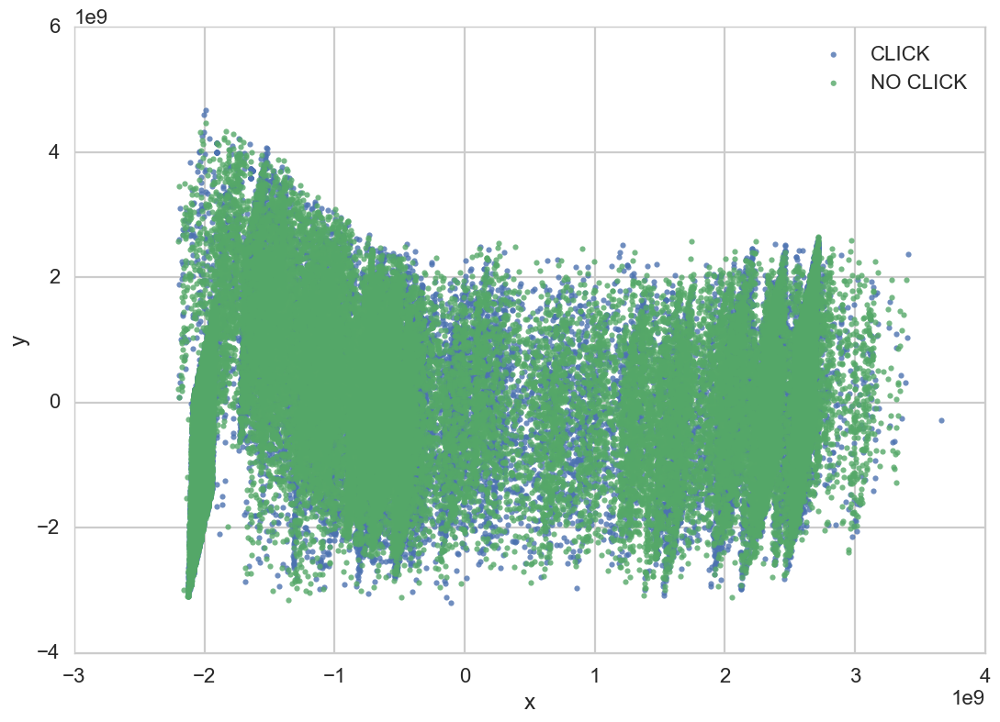

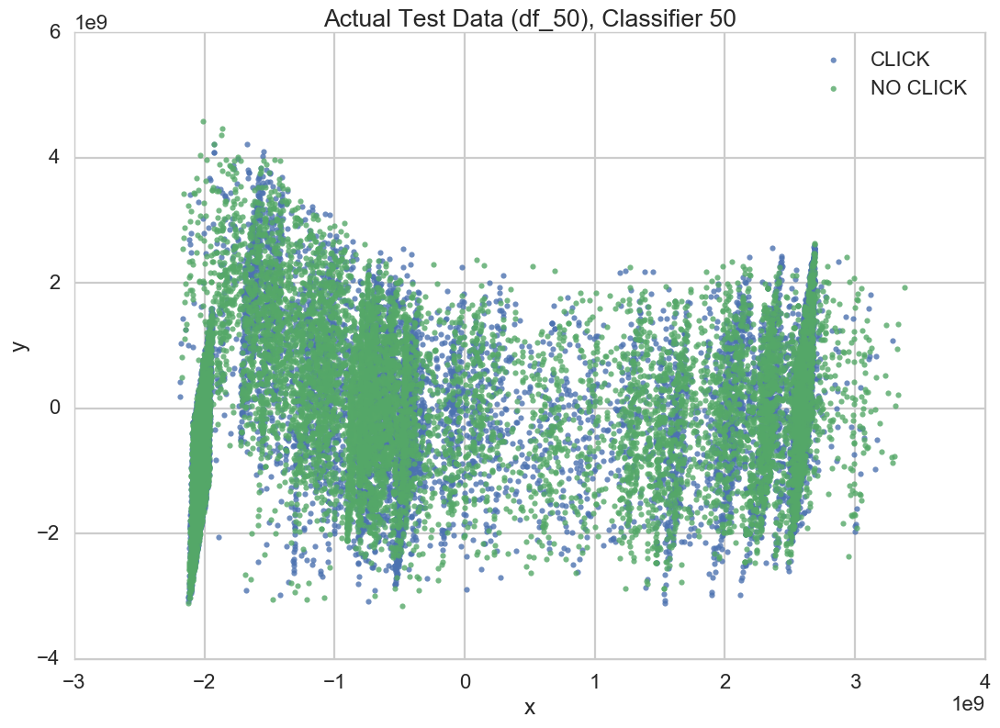

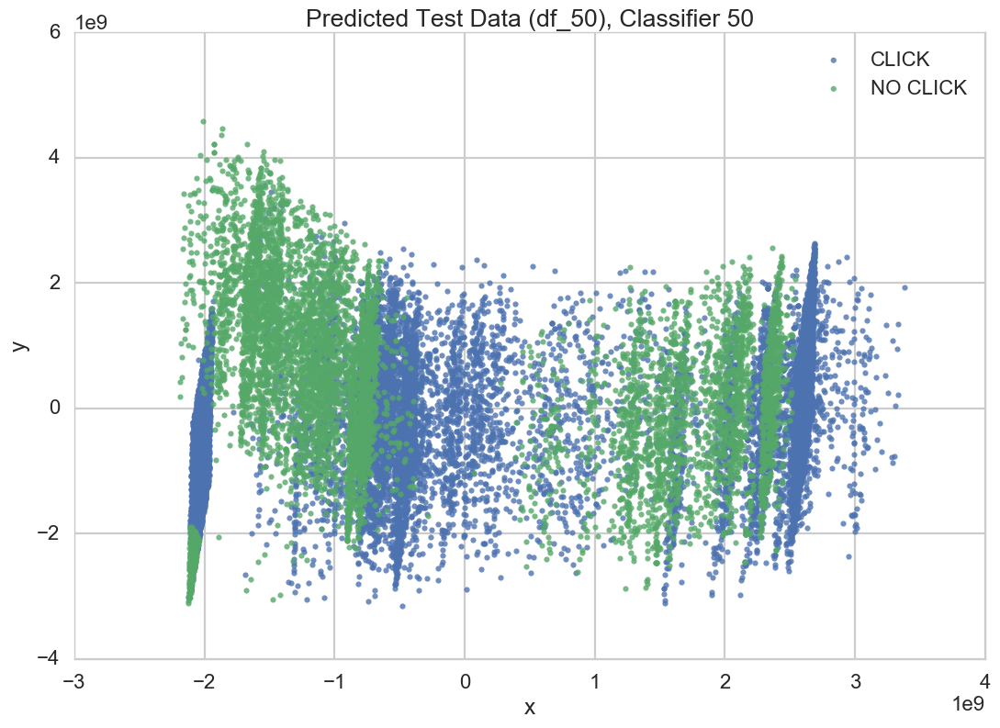

In [25]:
plot_sample(df_50)
plot_distribution(Xtestlr, ytestlr, clf_lr_50, predicted=False, title="Actual Test Data (df_50), Classifier 50")
plot_distribution(Xtestlr, ytestlr, clf_lr_50, predicted=True, title="Predicted Test Data (df_50), Classifier 50")

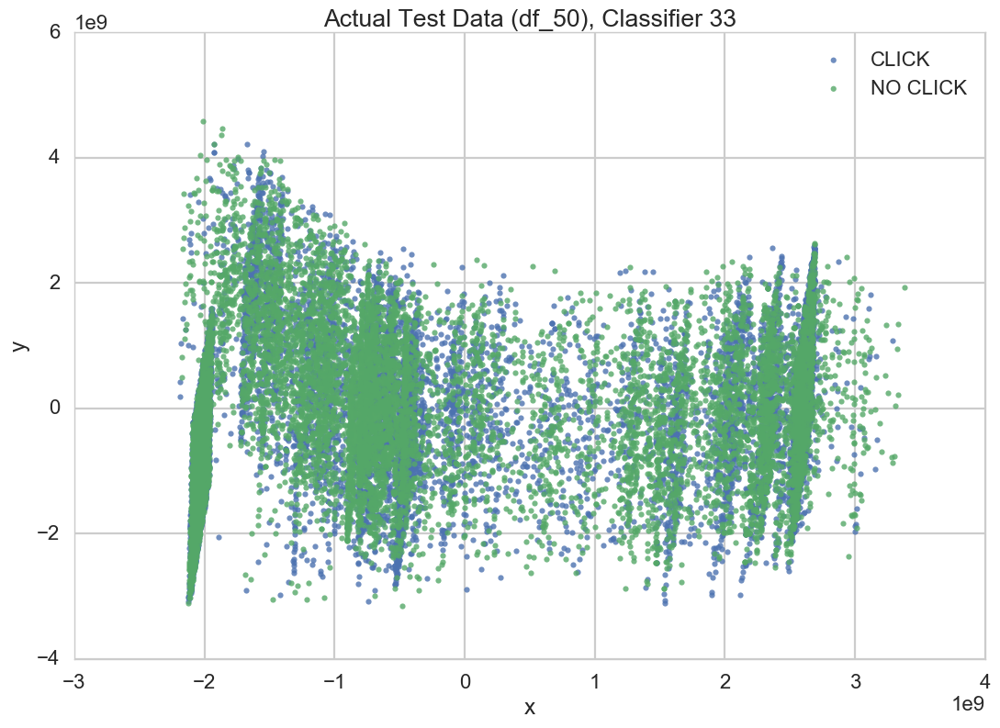

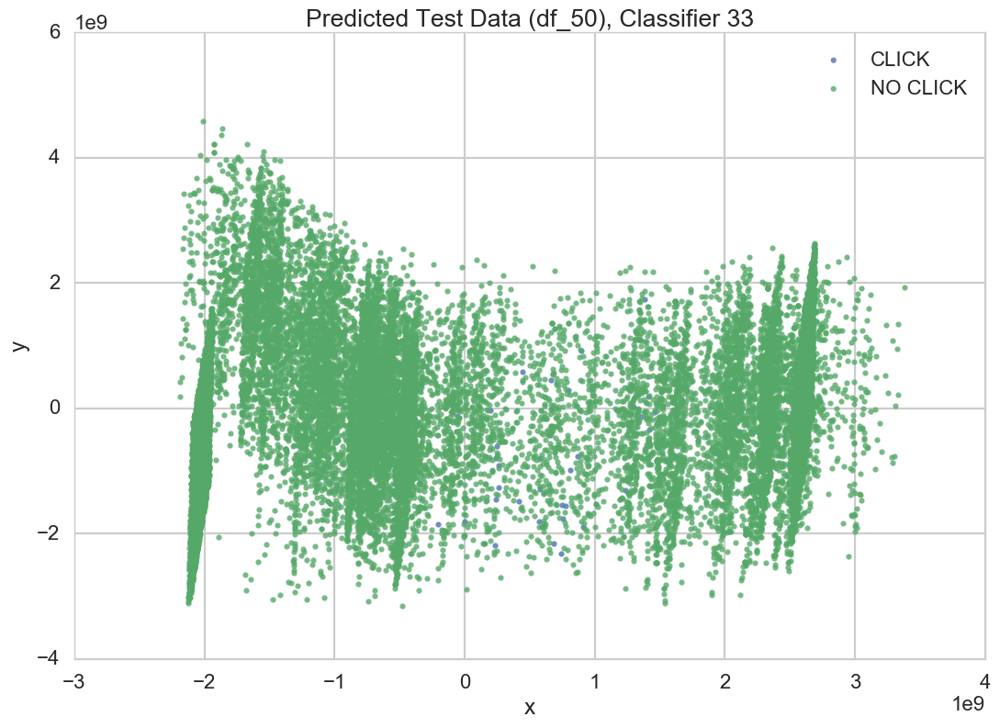

In [26]:
plot_distribution(Xtestlr, ytestlr, clf_lr_33, predicted=False, title="Actual Test Data (df_50), Classifier 33")
plot_distribution(Xtestlr, ytestlr, clf_lr_33, predicted=True,  title="Predicted Test Data (df_50), Classifier 33")

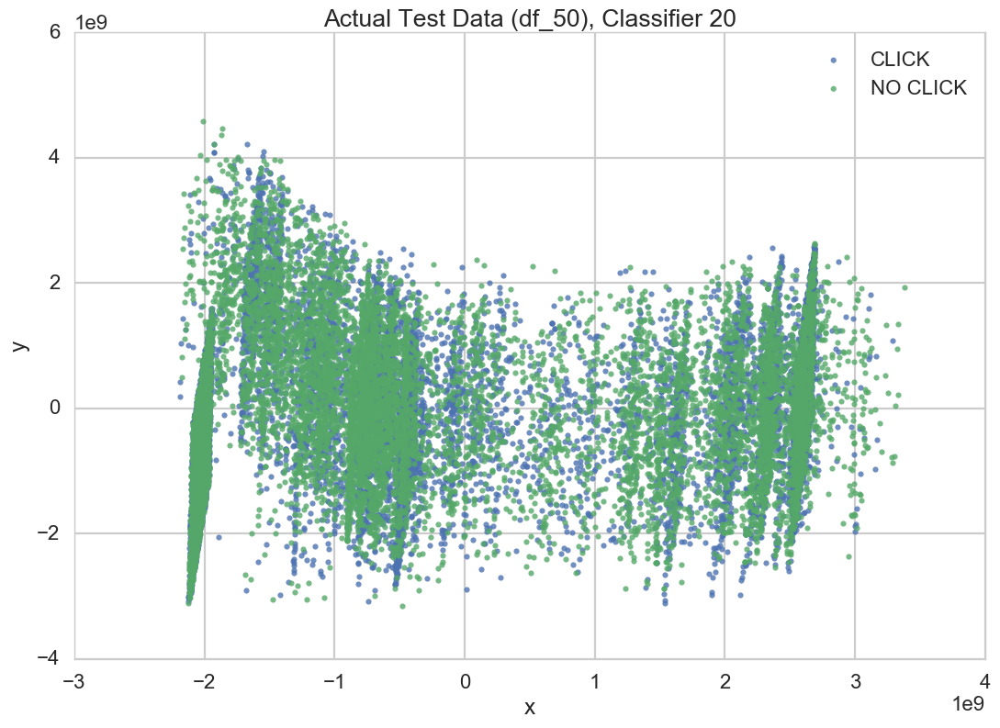

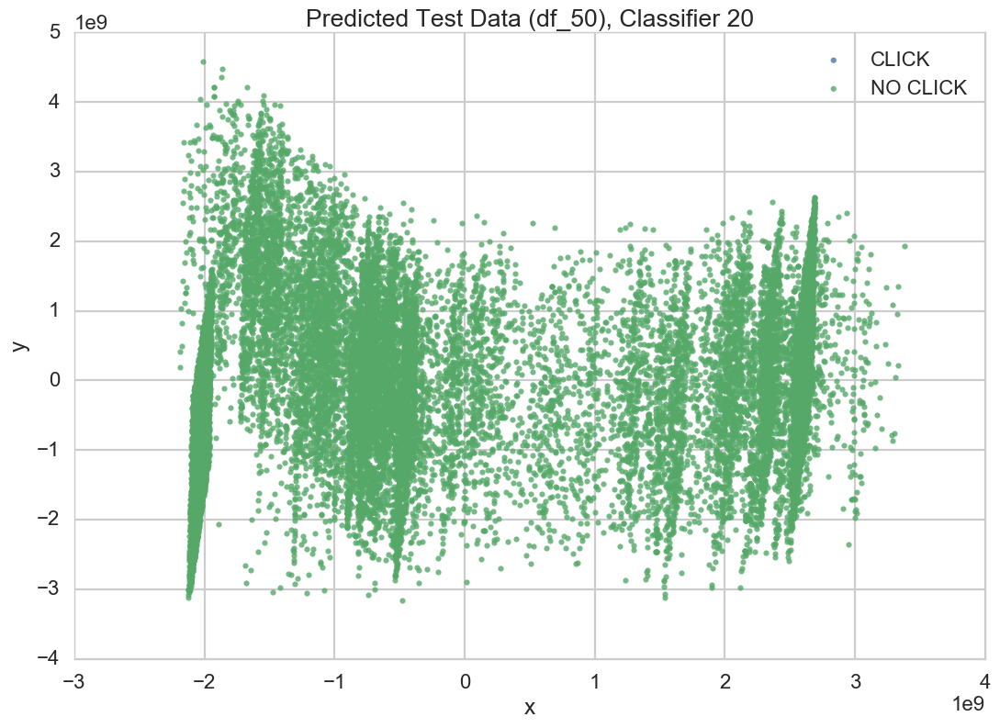

In [27]:
plot_distribution(Xtestlr, ytestlr, clf_lr_20, predicted=False,  title="Actual Test Data (df_50), Classifier 20")
plot_distribution(Xtestlr, ytestlr, clf_lr_20, predicted=True,  title="Predicted Test Data (df_50), Classifier 20")

In [28]:
# from sklearn import svm
# svm.SVC(kernel='linear')

In [29]:
from sklearn import svm
#from sklearn.linear_model import SGDClassifier
# clf_svm_50, Xtrain_svm_50, ytrain_svm_50, Xtest_svm_50, ytest_svm_50  = do_classify(svm.SVC(kernel='linear'), 
#                                                           {"C": [0.01, 0.1, 1, 10, 100]}, 
#                                                           df_50, x_columns, 'click', 0)

In [30]:
# clf = svm.SVC(kernel='linear', C=0.01)
# clf.fit(Xlr, ylr)

In [31]:
from sklearn.linear_model import SGDClassifier
clf_sgd_50, Xtrain_sgd_50, ytrain_sgd_50, Xtest_sgd_50, ytest_sgd_50  = do_classify(
                                                           SGDClassifier(loss='hinge', n_iter=100), 
                                                           {"alpha": [0.01, 0.1, 1, 10, 100]}, 
                                                           df_50, x_columns, 'click', 0)

BEST PARAMS {'alpha': 10}
Accuracy on training data: 0.50
Accuracy on test data:     0.51


In [32]:
clf_sgd_33, Xtrain_sgd_33, ytrain_sgd_33, Xtest_sgd_33, ytest_sgd_33  = do_classify(
                                                           SGDClassifier(loss='hinge', n_iter=100), 
                                                           {"alpha": [0.01, 0.1, 1, 10, 100]}, 
                                                           df_33, x_columns, 'click', 0)

BEST PARAMS {'alpha': 0.01}
Accuracy on training data: 0.36
Accuracy on test data:     0.36


In [33]:
clf_sgd_20, Xtrain_sgd_20, ytrain_sgd_20, Xtest_sgd_20, ytest_sgd_20  = do_classify(
                                                           SGDClassifier(loss='hinge', n_iter=100), 
                                                           {"alpha": [0.01, 0.1, 1, 10, 100]}, 
                                                           df_20, x_columns, 'click', 0)

BEST PARAMS {'alpha': 0.01}
Accuracy on training data: 0.79
Accuracy on test data:     0.79


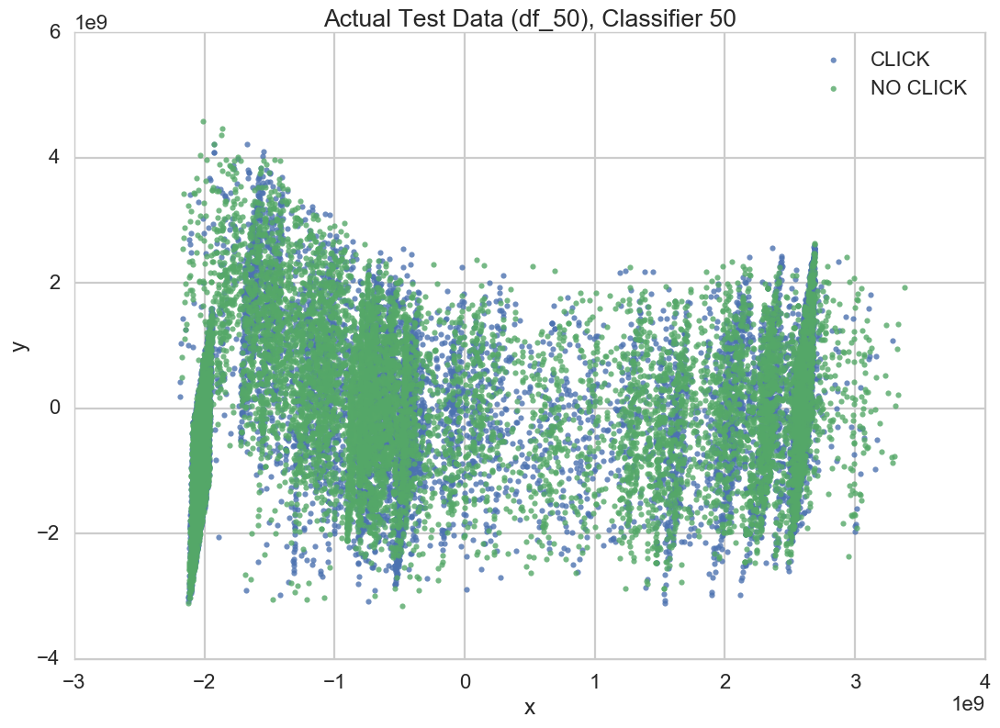

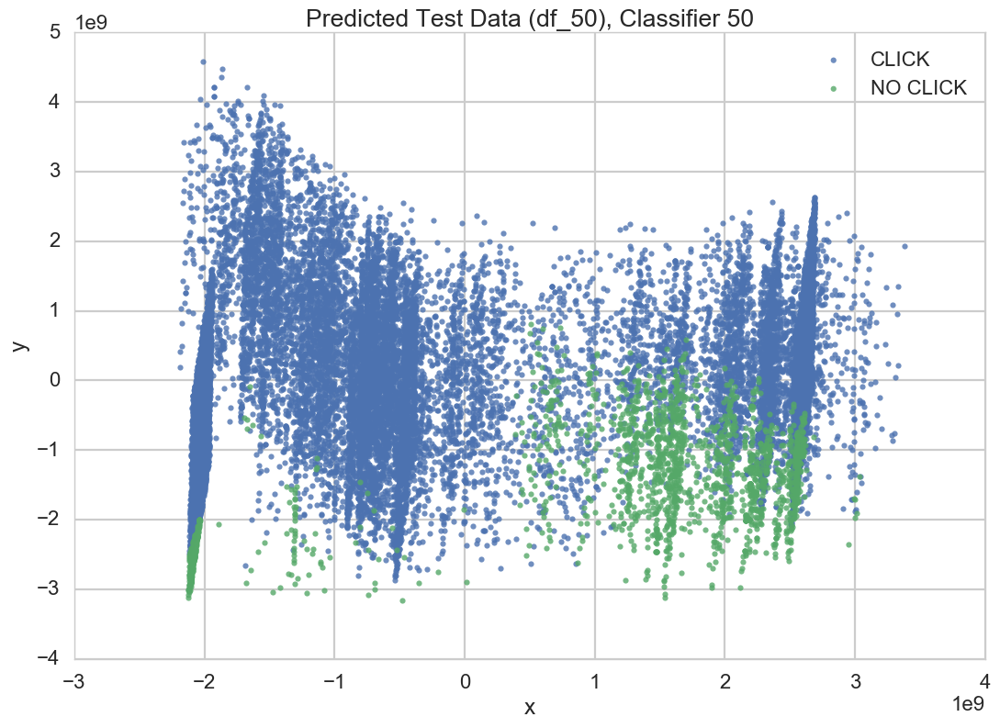

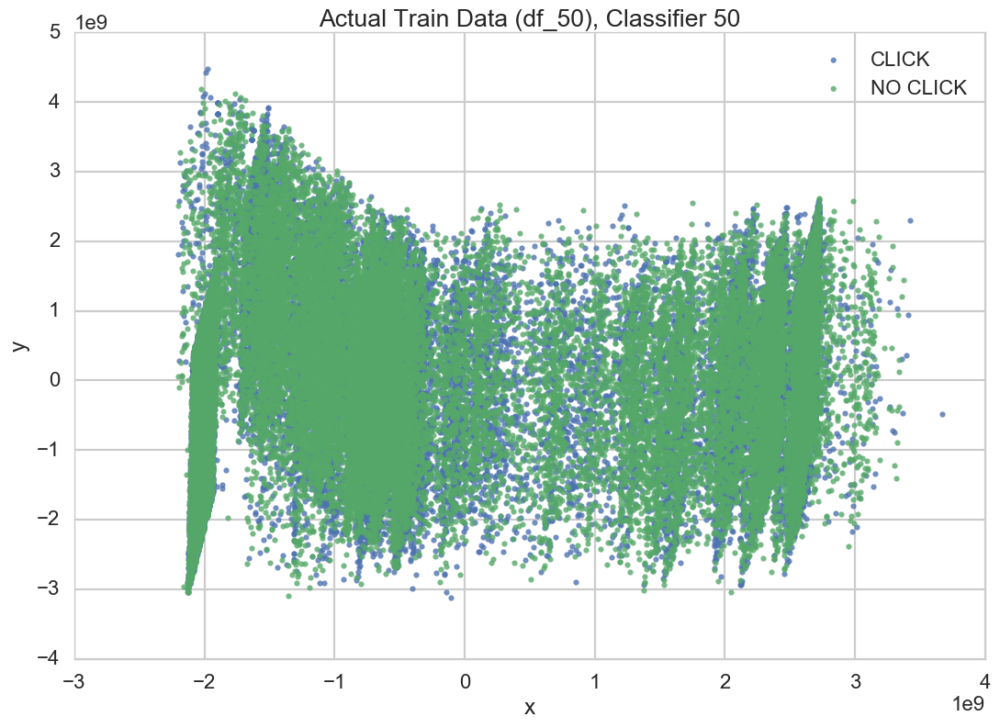

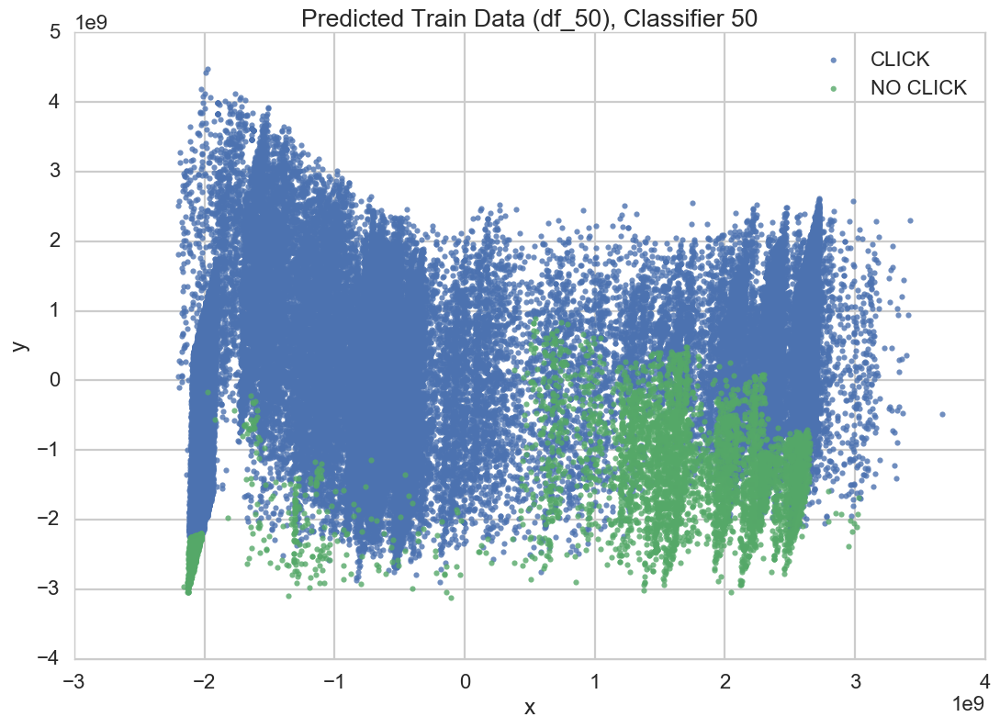

In [34]:
plot_distribution(Xtestlr, ytestlr, clf_sgd_50, predicted=False, title="Actual Test Data (df_50), Classifier 50")
plot_distribution(Xtestlr, ytestlr, clf_sgd_50, predicted=True, title="Predicted Test Data (df_50), Classifier 50")
plot_distribution(Xlr, ylr, clf_sgd_50, predicted=False, title="Actual Train Data (df_50), Classifier 50")
plot_distribution(Xlr, ylr, clf_sgd_50, predicted=True, title="Predicted Train Data (df_50), Classifier 50")

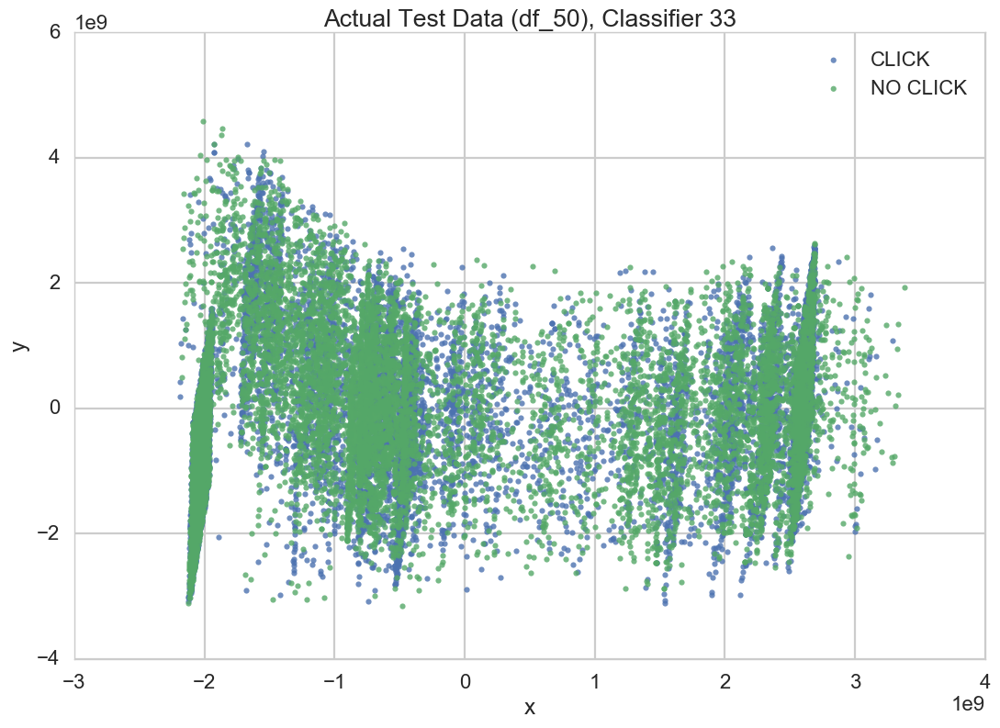

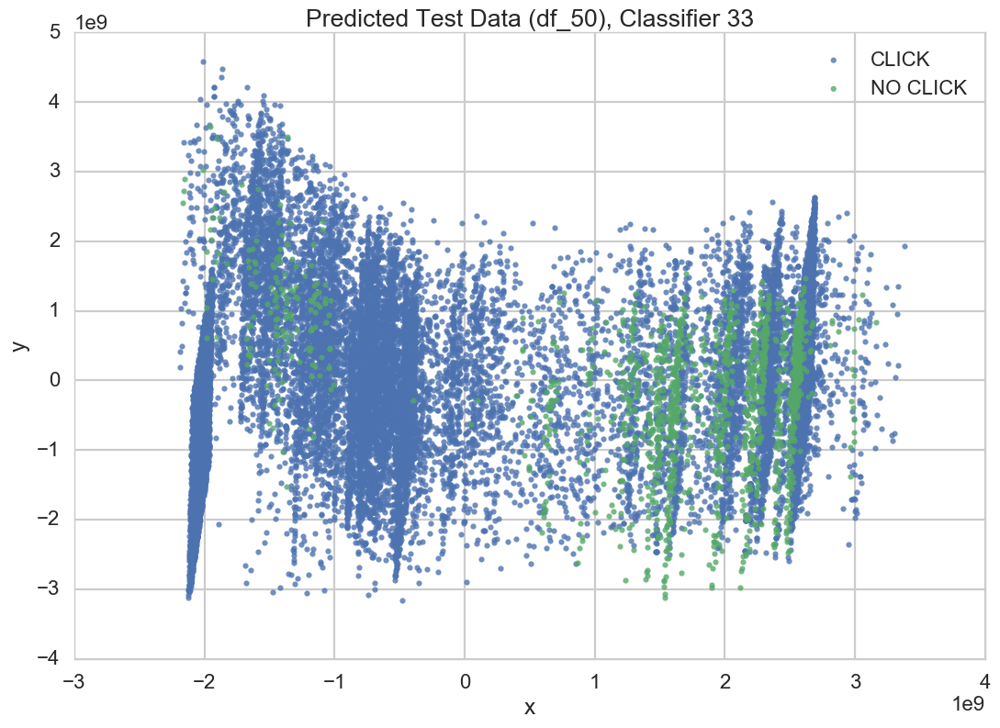

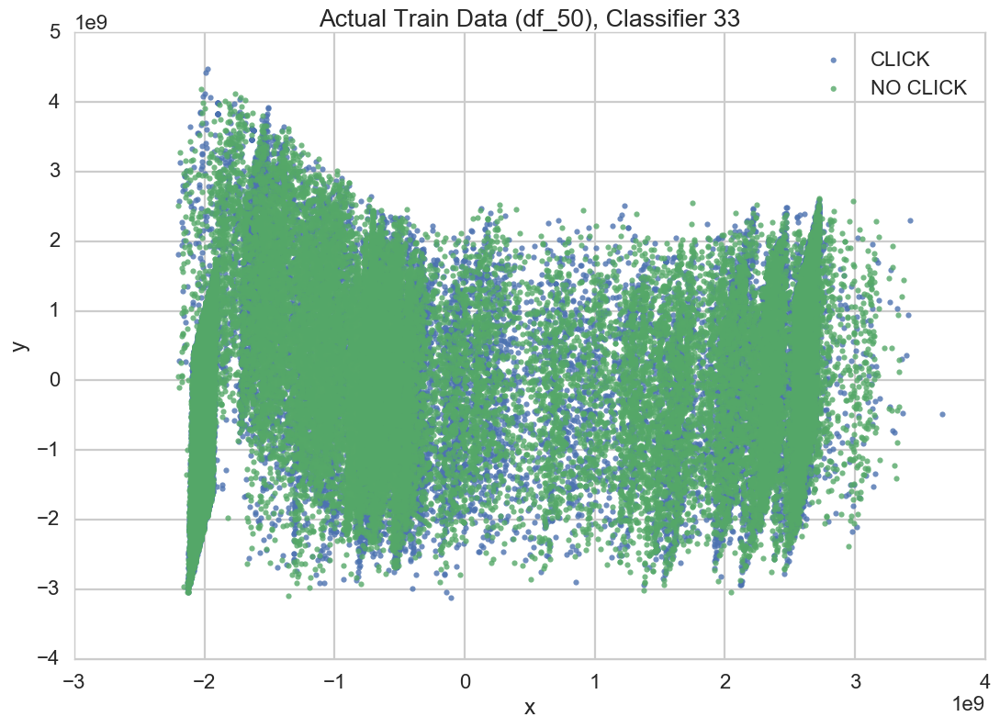

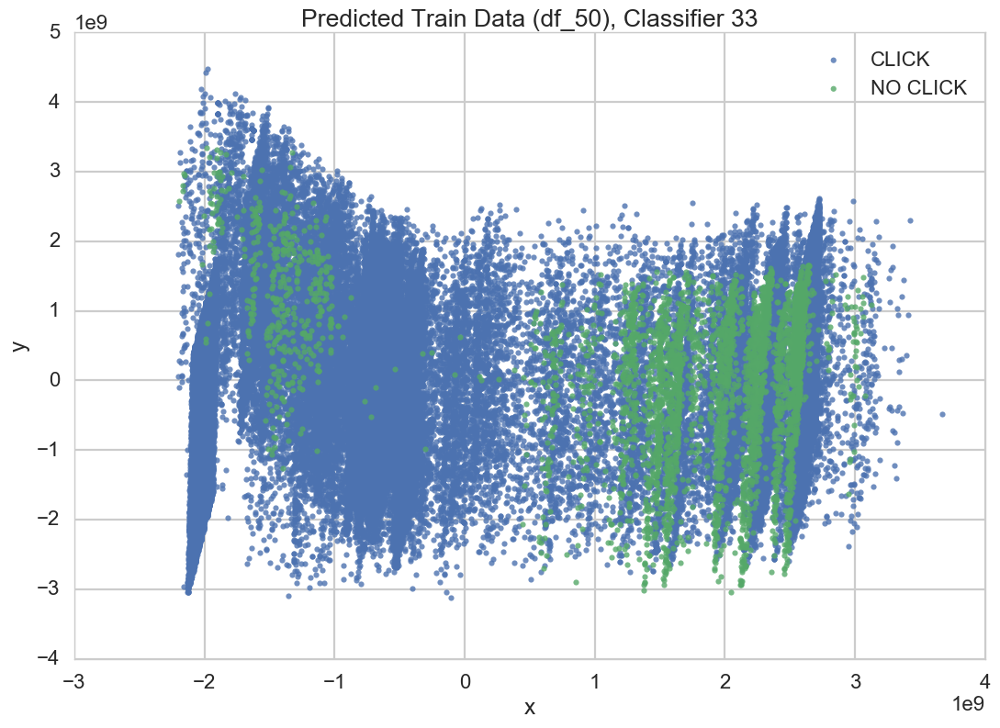

In [35]:
plot_distribution(Xtestlr, ytestlr, clf_sgd_33, predicted=False, title="Actual Test Data (df_50), Classifier 33")
plot_distribution(Xtestlr, ytestlr, clf_sgd_33, predicted=True, title="Predicted Test Data (df_50), Classifier 33")
plot_distribution(Xlr, ylr, clf_sgd_33, predicted=False, title="Actual Train Data (df_50), Classifier 33")
plot_distribution(Xlr, ylr, clf_sgd_33, predicted=True, title="Predicted Train Data (df_50), Classifier 33")

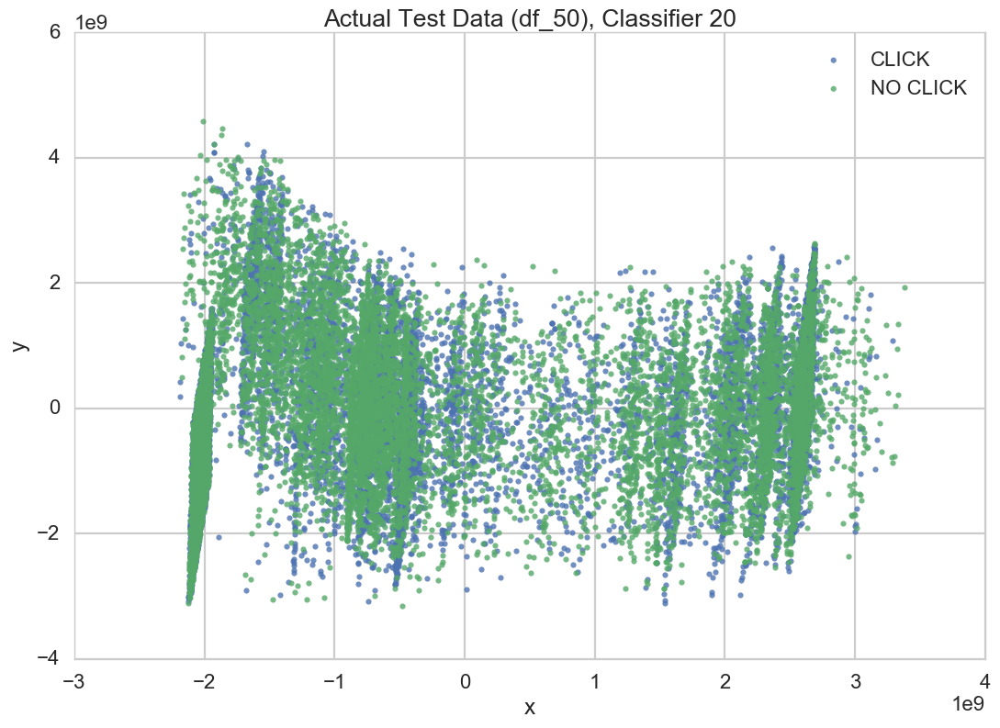

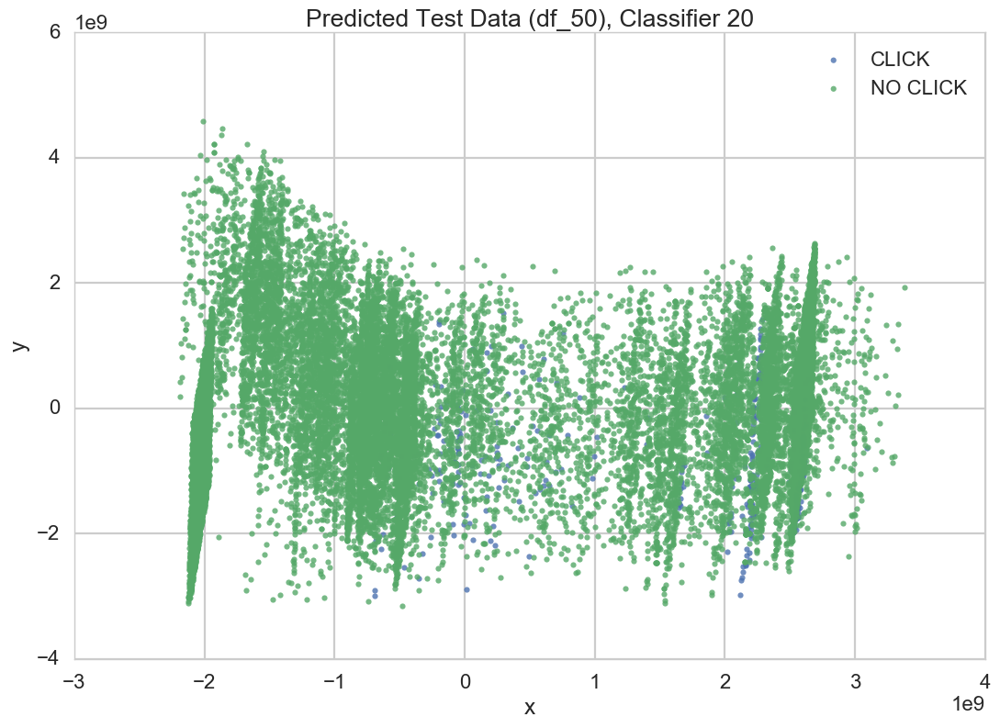

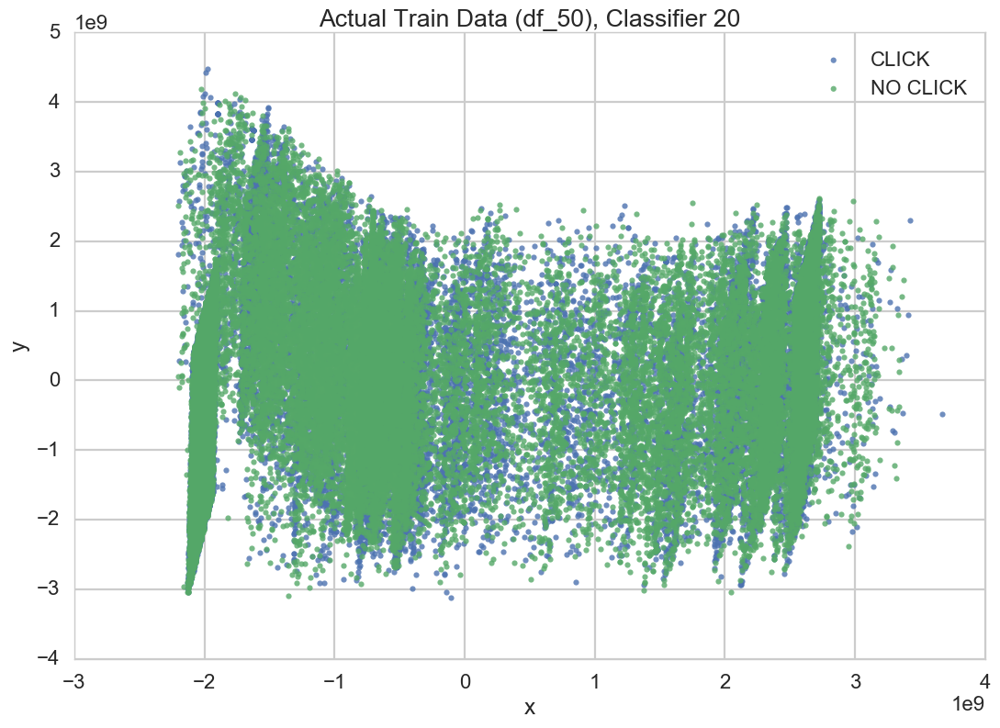

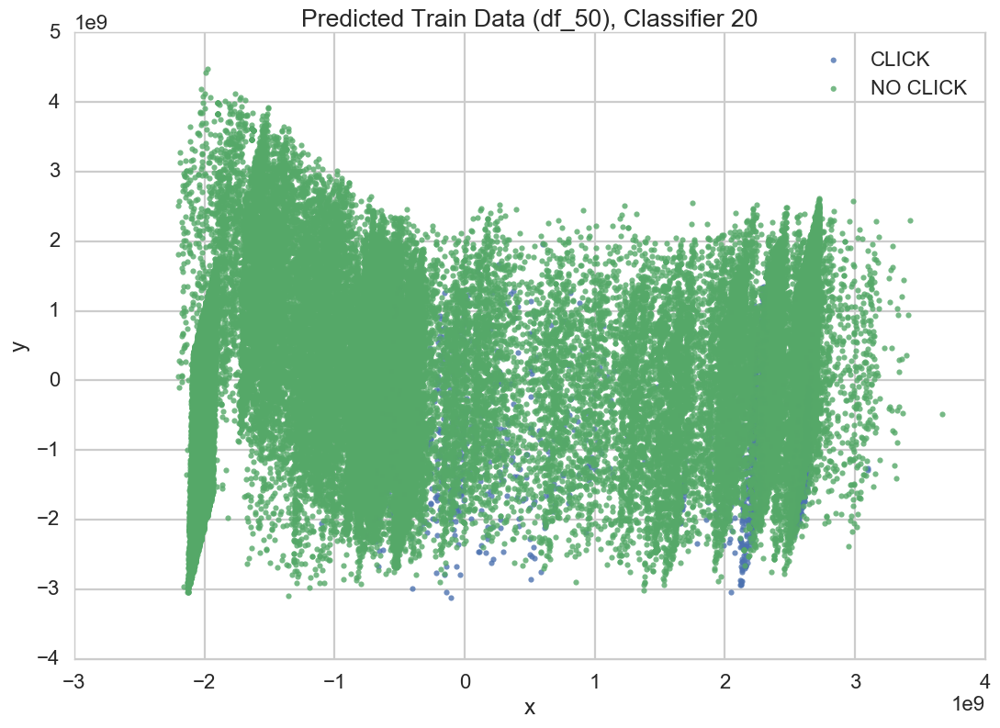

In [36]:
plot_distribution(Xtestlr, ytestlr, clf_sgd_20, predicted=False, title="Actual Test Data (df_50), Classifier 20")
plot_distribution(Xtestlr, ytestlr, clf_sgd_20, predicted=True, title="Predicted Test Data (df_50), Classifier 20")
plot_distribution(Xlr, ylr, clf_sgd_20, predicted=False, title="Actual Train Data (df_50), Classifier 20")
plot_distribution(Xlr, ylr, clf_sgd_20, predicted=True, title="Predicted Train Data (df_50), Classifier 20")

In [39]:
print(confusion_matrix(ytest_lr_50, clf_sgd_50.predict(Xtest_lr_50)))
print(confusion_matrix(ytest_lr_33, clf_sgd_33.predict(Xtest_lr_33)))
print(confusion_matrix(ytest_lr_20, clf_sgd_20.predict(Xtest_lr_20)))
print(confusion_matrix(ytest_lr_50, clf_sgd_20.predict(Xtest_lr_50)))
print(confusion_matrix(ytest_lr_50, clf_sgd_20.predict(Xtest_lr_50)))
print(confusion_matrix(ytestlr, clf_sgd_20.predict(Xtestlr)))
print(confusion_matrix(ylr, clf_sgd_20.predict(Xlr)))

[[ 795 7317]
 [ 723 7337]]
[[ 896 9838]
 [ 417 5021]]
[[12716   239]
 [ 3150    67]]
[[7966  146]
 [7870  190]]
[[7966  146]
 [7870  190]]
[[9902  182]
 [9912  219]]
[[29768   577]
 [29633   665]]


In [40]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=120, oob_score=True)
rfc.fit(Xlr, ylr)
print(accuracy_score(rfc.predict(Xtestlr), ytestlr))

0.63893148652


In [41]:
clf_rfc_50, Xtrain_rfc_50, ytrain_rfc_50, Xtest_rfc_50, ytest_rfc_50  = do_classify(
                                                           RandomForestClassifier(oob_score=True), 
                                                           {"n_estimators": [50, 80, 100, 120, 140]}, 
                                                           df_50, x_columns, 'click', 0)

BEST PARAMS {'n_estimators': 120}
Accuracy on training data: 1.00
Accuracy on test data:     0.64


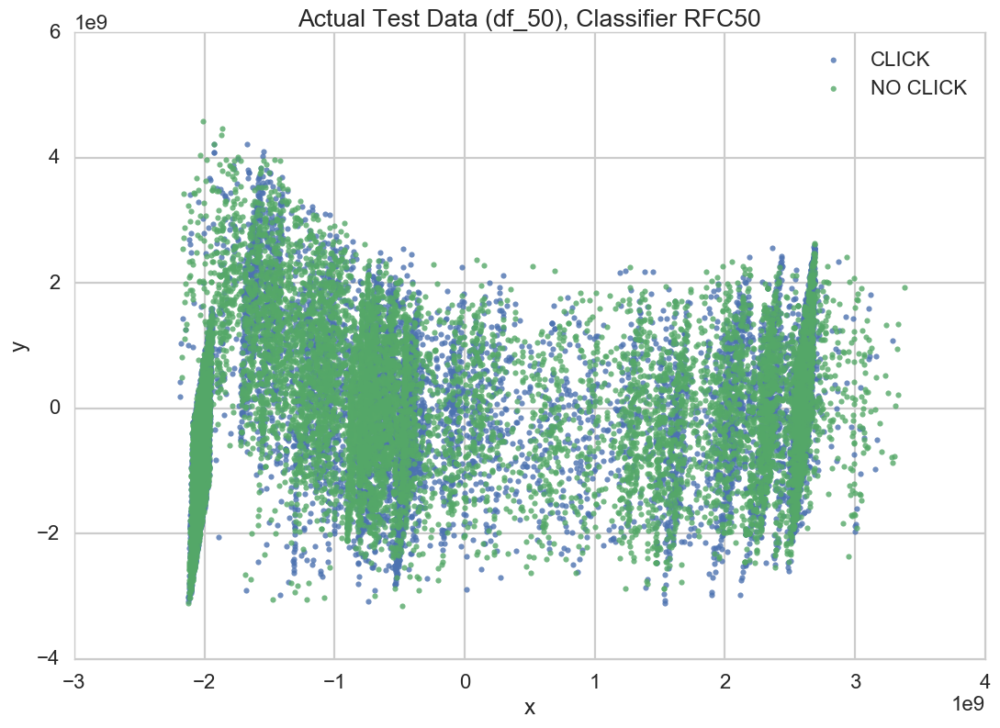

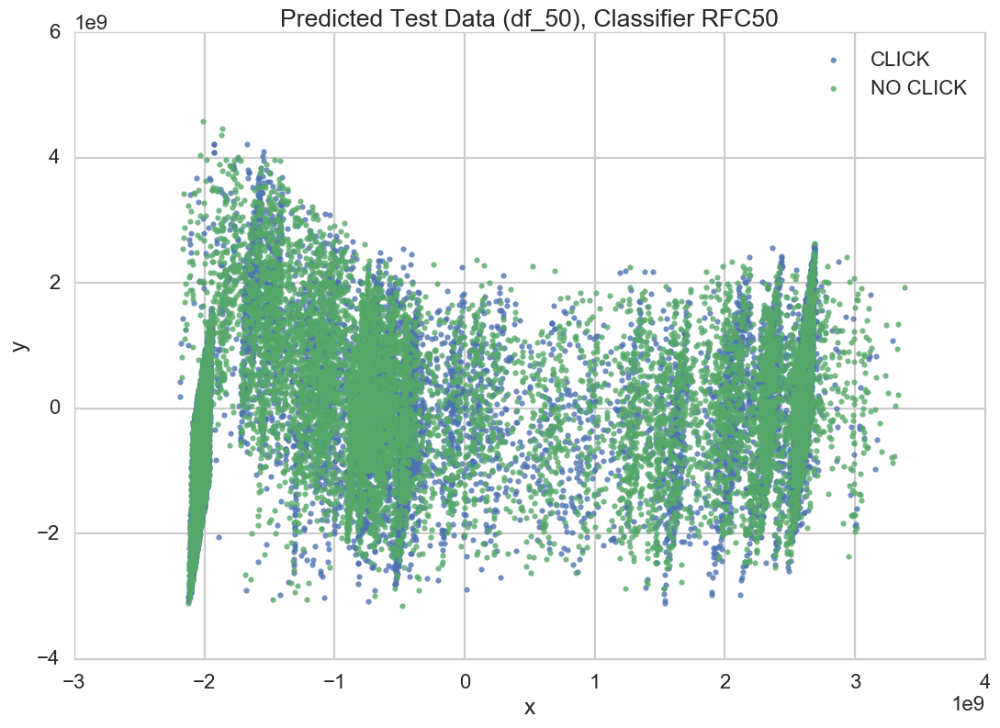

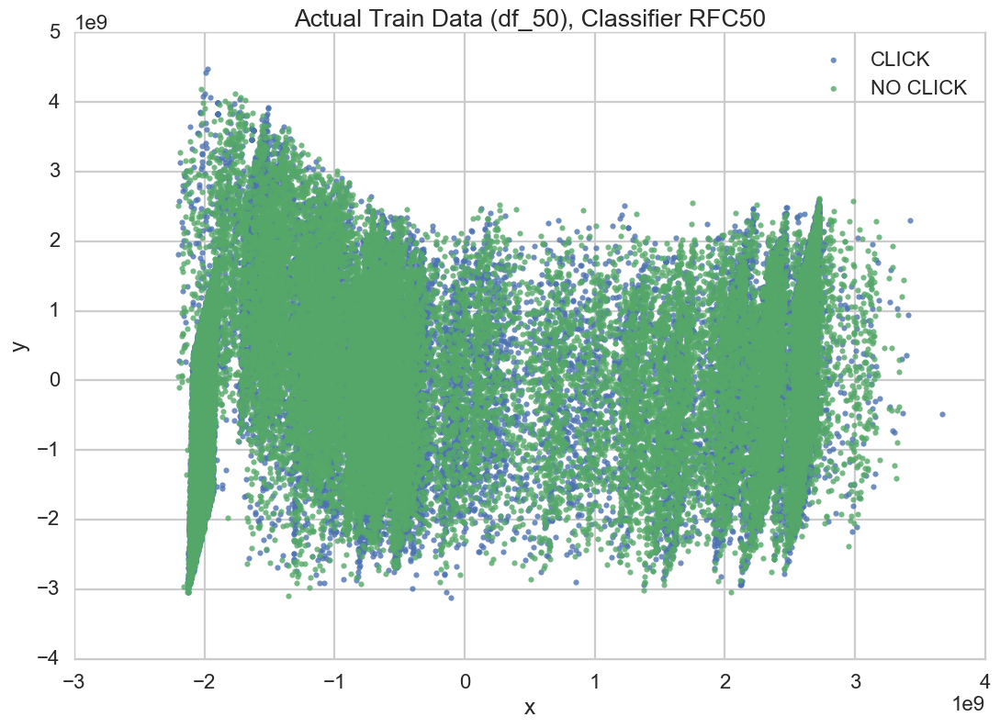

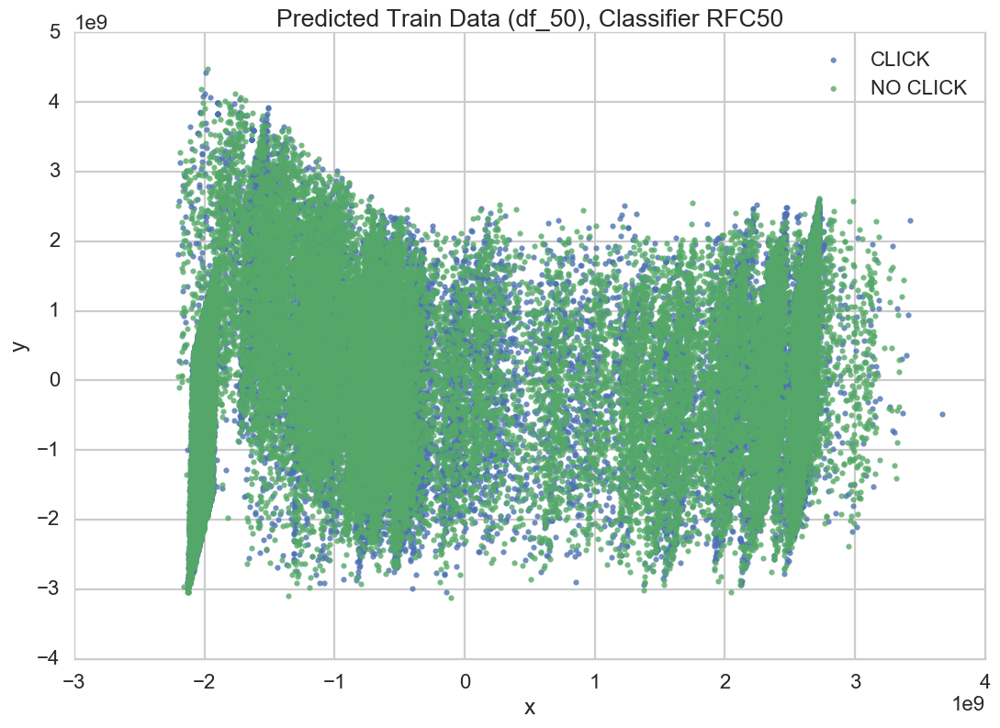

In [42]:
plot_distribution(Xtestlr, ytestlr, clf_rfc_50, predicted=False, title="Actual Test Data (df_50), Classifier RFC50")
plot_distribution(Xtestlr, ytestlr, clf_rfc_50, predicted=True, title="Predicted Test Data (df_50), Classifier RFC50")
plot_distribution(Xlr, ylr, clf_rfc_50, predicted=False, title="Actual Train Data (df_50), Classifier RFC50")
plot_distribution(Xlr, ylr, clf_rfc_50, predicted=True, title="Predicted Train Data (df_50), Classifier RFC50")

In [43]:
X50 = df_50[x_columns].values
y50 = (df_50.click > 0).values
X33 = df_33[x_columns].values
y33 = (df_33.click > 0).values
X20 = df_20[x_columns].values
y20 = (df_20.click > 0).values

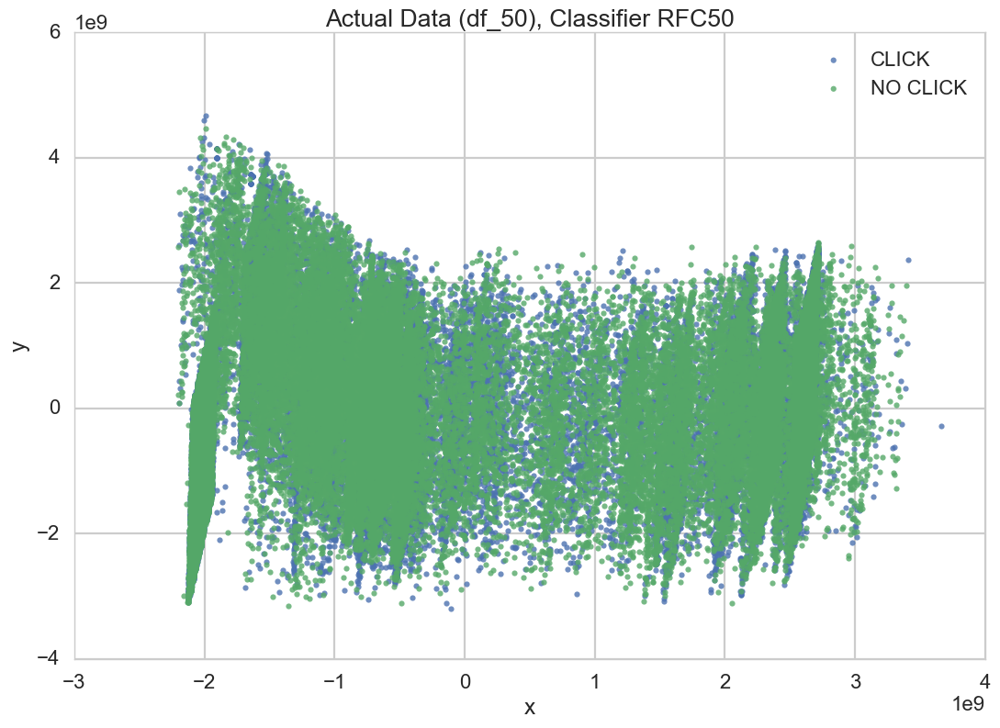

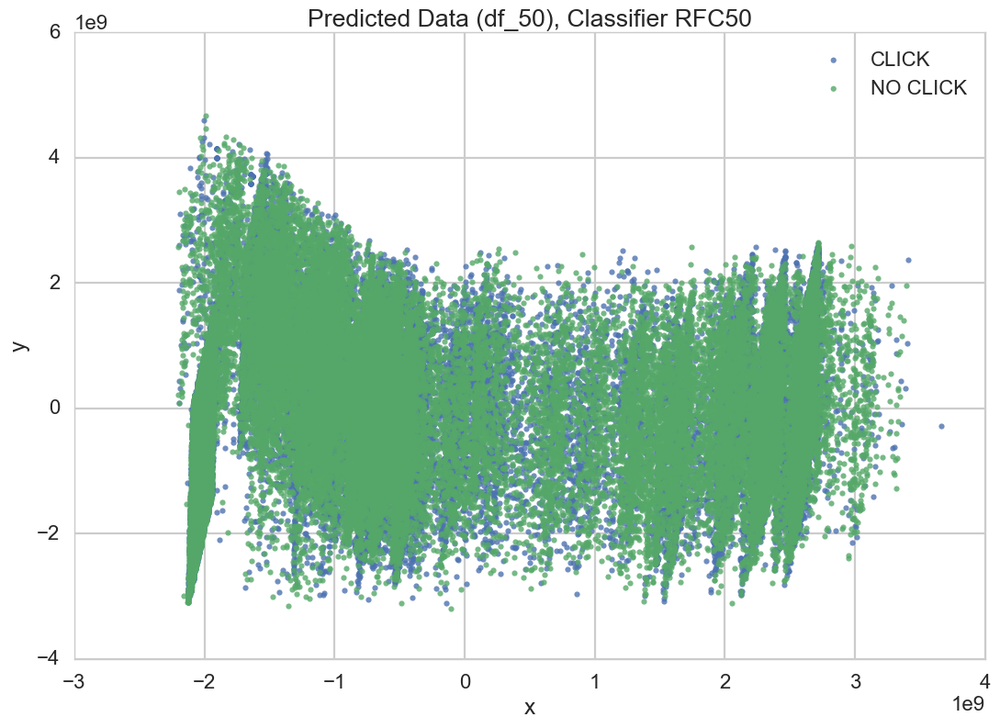

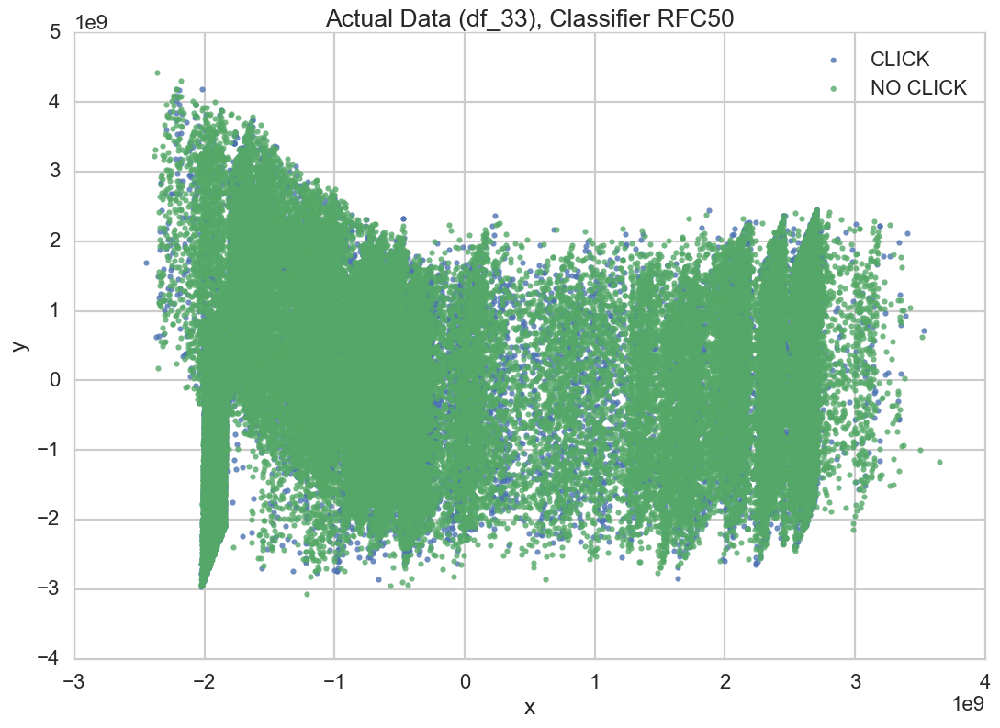

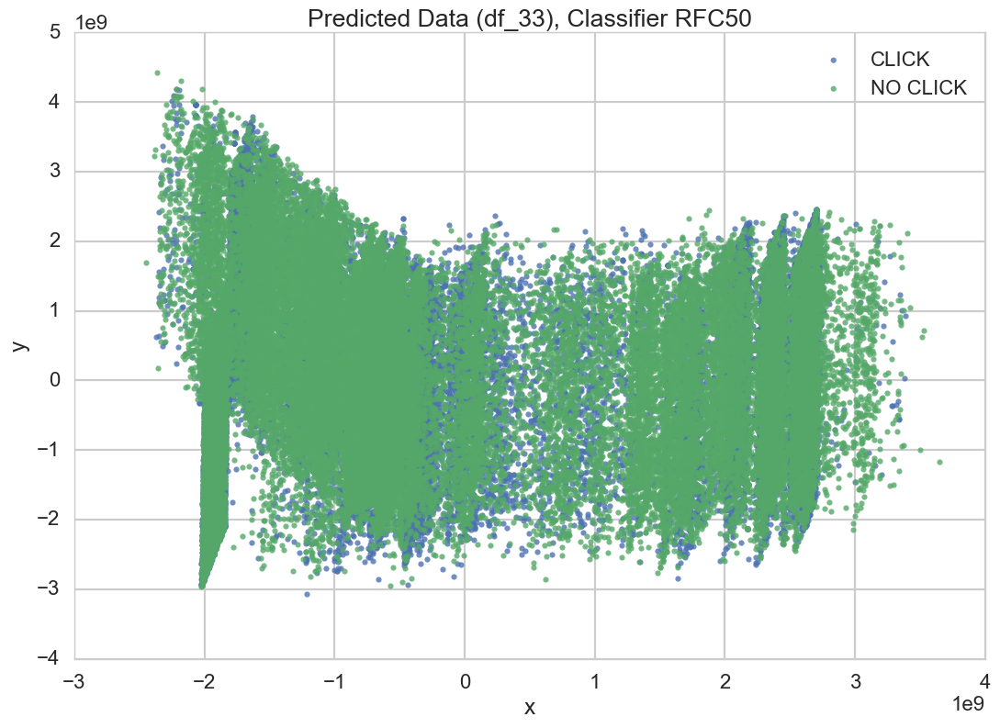

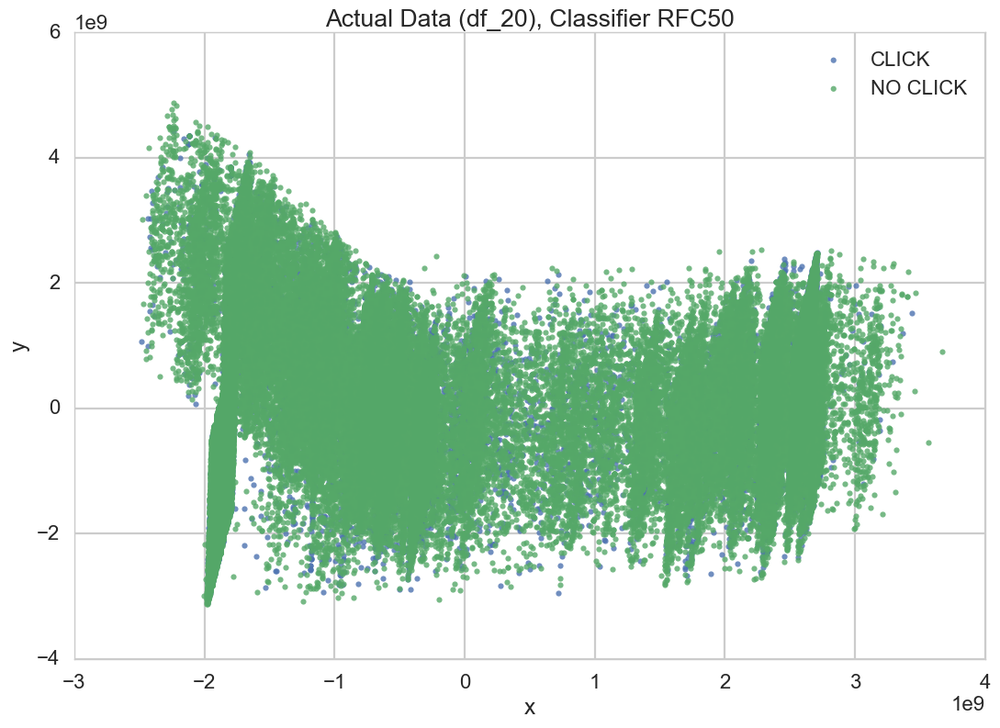

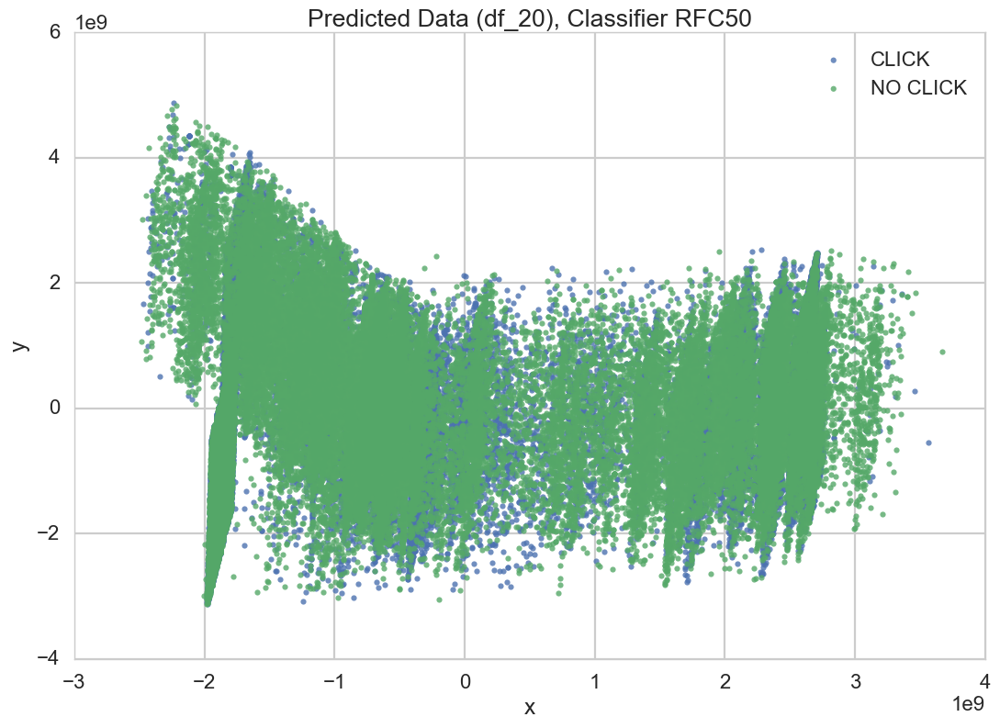

In [44]:
plot_distribution(X50, y50, clf_rfc_50, predicted=False, title="Actual Data (df_50), Classifier RFC50")
plot_distribution(X50, y50, clf_rfc_50, predicted=True, title="Predicted Data (df_50), Classifier RFC50")
plot_distribution(X33, y33, clf_rfc_50, predicted=False, title="Actual Data (df_33), Classifier RFC50")
plot_distribution(X33, y33, clf_rfc_50, predicted=True, title="Predicted Data (df_33), Classifier RFC50")
plot_distribution(X20, y20, clf_rfc_50, predicted=False, title="Actual Data (df_20), Classifier RFC50")
plot_distribution(X20, y20, clf_rfc_50, predicted=True, title="Predicted Data (df_20), Classifier RFC50")

In [45]:
print(confusion_matrix(y33, clf_rfc_50.predict(X33)))
print(confusion_matrix(y20, clf_rfc_50.predict(X20)))

[[34237 19938]
 [ 9607 17077]]
[[40774 23913]
 [ 5801 10371]]


In [46]:
print(accuracy_score(clf_rfc_50.predict(X33), y33))
print(accuracy_score(clf_rfc_50.predict(X20), y20))

0.634610865828
0.632520807826


In [47]:
print(clf_rfc_50.n_features_)
print(clf_rfc_50.feature_importances_)

22
[ 0.08314776  0.00338184  0.00725254  0.04187628  0.03996097  0.01234282
  0.02595911  0.01308355  0.01291512  0.03374602  0.26977923  0.18767972
  0.0033433   0.01246107  0.08758371  0.00610202  0.01010793  0.0318077
  0.0120369   0.02386201  0.0540665   0.0275039 ]


In [48]:
clf_rfc_33, Xtrain_rfc_33, ytrain_rfc_33, Xtest_rfc_33, ytest_rfc_33  = do_classify(
                                        RandomForestClassifier(min_weight_fraction_leaf=0.33, oob_score=True), 
                                        {"n_estimators": [50, 80, 100, 120]}, 
                                        df_33, x_columns, 'click', 0)


BEST PARAMS {'n_estimators': 50}
Accuracy on training data: 0.67
Accuracy on test data:     0.67


In [49]:
print(accuracy_score(clf_rfc_33.predict(X50), y50))
print(accuracy_score(clf_rfc_33.predict(X33), y33))
print(accuracy_score(clf_rfc_33.predict(X20), y20))

0.5
0.66999344538
0.799997526559


In [50]:
print(clf_rfc_33.n_features_)
print(clf_rfc_33.feature_importances_)

22
[ 0.          0.          0.          0.1         0.16        0.          0.
  0.          0.05897795  0.          0.00028252  0.06092656  0.          0.
  0.1         0.          0.          0.13981296  0.08        0.06        0.02
  0.2       ]


In [51]:
clf_rfc_20, Xtrain_rfc_20, ytrain_rfc_20, Xtest_rfc_20, ytest_rfc_20  = do_classify(
                                        RandomForestClassifier(min_weight_fraction_leaf=0.2, oob_score=True), 
                                        {"n_estimators": [50, 80, 100, 120]}, 
                                        df_20, x_columns, 'click', 0)

BEST PARAMS {'n_estimators': 50}
Accuracy on training data: 0.80
Accuracy on test data:     0.80


In [52]:
print(accuracy_score(clf_rfc_20.predict(X50), y50))
print(accuracy_score(clf_rfc_20.predict(X33), y33))
print(accuracy_score(clf_rfc_20.predict(X20), y20))

0.5
0.66999344538
0.799997526559


In [53]:
print(clf_rfc_20.n_features_)
print(clf_rfc_20.feature_importances_)

22
[  1.52494772e-03   0.00000000e+00   1.99434603e-03   3.96552064e-02
   1.07944645e-01   6.73941923e-02   1.43907047e-02   0.00000000e+00
   1.66853982e-01   0.00000000e+00   3.27749511e-05   3.38893718e-03
   0.00000000e+00   0.00000000e+00   7.32561579e-02   0.00000000e+00
   0.00000000e+00   7.52006492e-02   3.60137054e-02   4.80071622e-02
   3.06924083e-02   3.13650181e-01]


In [54]:
df_test = sample_test_data()

In [55]:
len(df_test.index)

82395

In [56]:
len(df_test.columns)

23

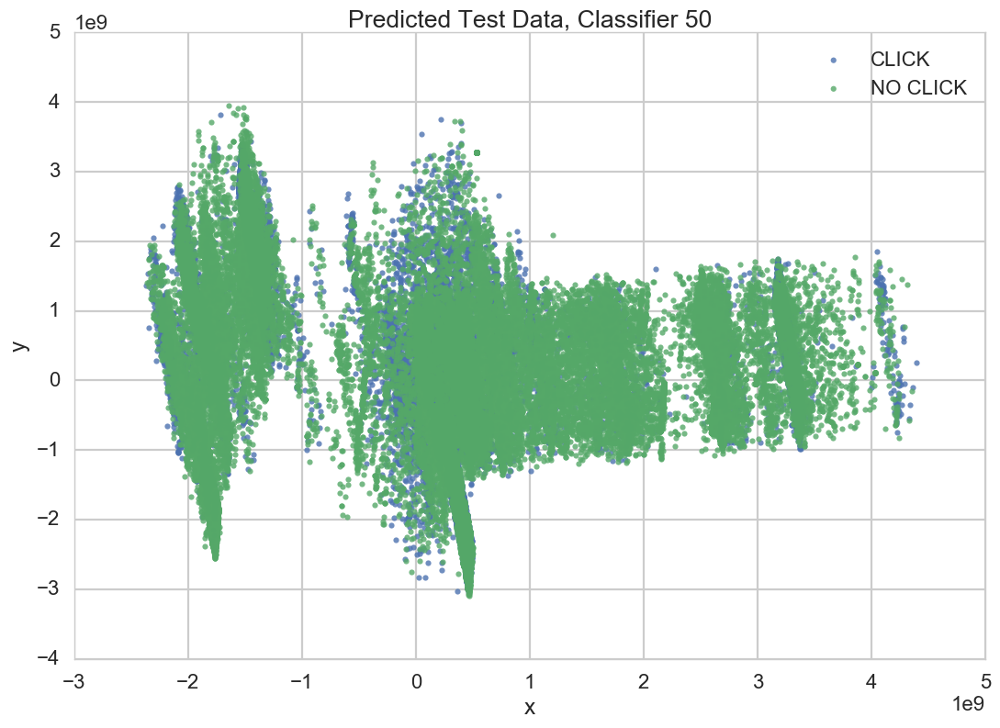

In [57]:
XTEST = df_test[x_columns].values
yTEST_50 = clf_rfc_50.predict(XTEST)
yTEST_33 = clf_rfc_33.predict(XTEST)
yTEST_20 = clf_rfc_20.predict(XTEST)
plot_distribution(XTEST, None, clf_rfc_50, predicted=True, title="Predicted Test Data, Classifier 50")

In [58]:
print(accuracy_score(clf_rfc_33.predict(XTEST), yTEST_50))
print(accuracy_score(clf_rfc_20.predict(XTEST), yTEST_50))

0.663778141878
0.663778141878


In [59]:
def calculate_test_ctr(yTEST):
    df_test1 = df_test.copy()
    df_test1['click'] = yTEST
    neg_predict = len(df_test1[df_test1.click ==0].index)
    pos_predict = len(df_test1[df_test1.click >0].index)
    ctr_test = pos_predict * 100.0 / (pos_predict + neg_predict)
    return ctr_test

In [60]:
print(calculate_test_ctr(yTEST_50))
print(calculate_test_ctr(yTEST_33))
print(calculate_test_ctr(yTEST_20))

33.62218581224589
0.0
0.0


In [61]:
from sklearn.calibration import calibration_curve
all_clfs = [(clf_lr_50, 'Logistic50'),
            (clf_lr_33, 'Logistic33'),
            #(clf_lr_20, 'Logistic20'),
            (clf_sgd_50, 'SGD50'),
            #(clf_sgd_33, 'SGD, 33-66 Class Ratio'),
            #(clf_sgd_20, 'SGD, 20-80 Class Ratio'),
            (clf_rfc_50, 'RFC50'),
            (clf_rfc_33, 'RFC33'),
            (clf_rfc_20, 'RFC20')]

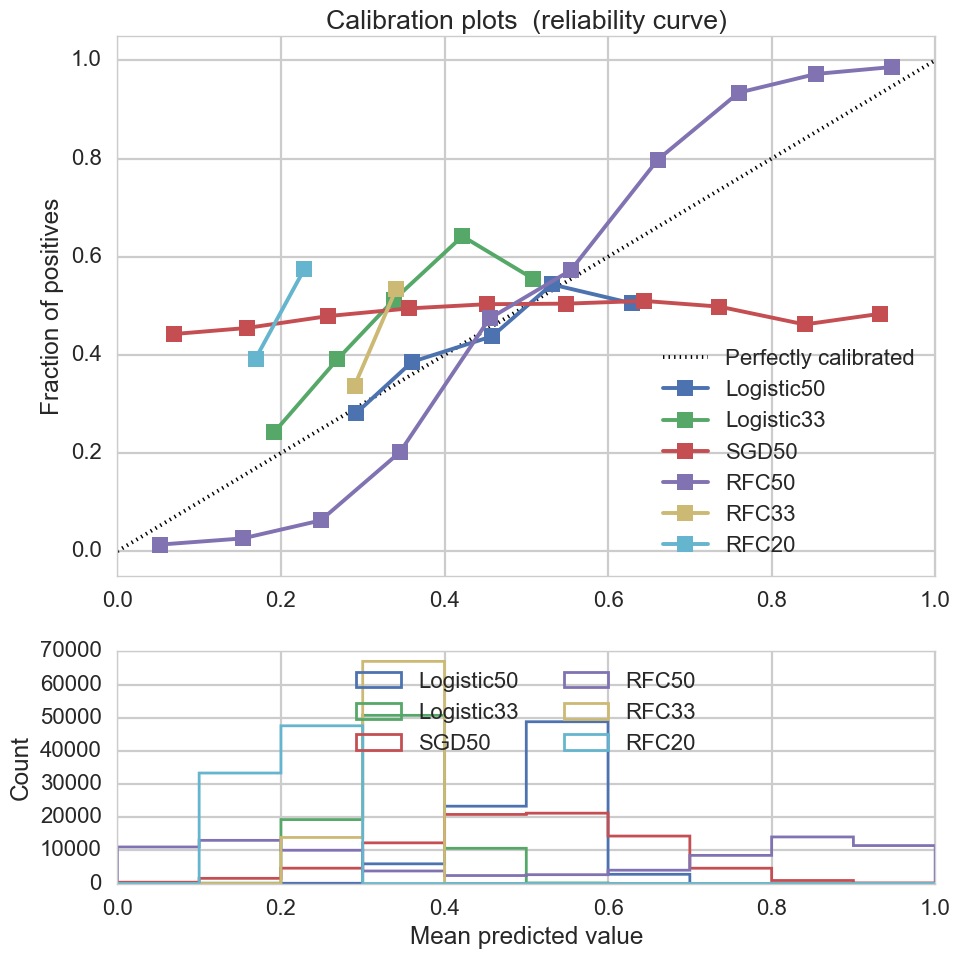

In [62]:
plt.figure(figsize=(10, 10))
ax1 = plt.subplot2grid((3, 1), (0, 0), rowspan=2)
ax2 = plt.subplot2grid((3, 1), (2, 0))

ax1.plot([0, 1], [0, 1], "k:", label="Perfectly calibrated")
for clf_, name in all_clfs:
    if hasattr(clf_, "predict_proba"):
        prob_pos = clf_.predict_proba(X50)[:, 1]
    else:  # use decision function
        prob_pos = clf_.decision_function(X50)
        prob_pos = \
            (prob_pos - prob_pos.min()) / (prob_pos.max() - prob_pos.min())
    fraction_of_positives, mean_predicted_value = \
        calibration_curve(y50, prob_pos, n_bins=10)

    ax1.plot(mean_predicted_value, fraction_of_positives, "s-",
             label="%s" % (name, ))

    ax2.hist(prob_pos, range=(0, 1), bins=10, label=name,
             histtype="step", lw=2)

ax1.set_ylabel("Fraction of positives")
ax1.set_ylim([-0.05, 1.05])
ax1.legend(loc="lower right")
ax1.set_title('Calibration plots  (reliability curve)')

ax2.set_xlabel("Mean predicted value")
ax2.set_ylabel("Count")
ax2.legend(loc="upper center", ncol=2)

plt.tight_layout()
plt.show()